# Правила оформления

Здесь (или в сгенерированном вами html / pdf / ...) должны находиться картинки и слова к ним. Картинки должны содержать всевозможную интересную информацию, которые вы достали из данных с помощью методов визуализации. Слова должны являть собой ваши размышления об увиденном на картинке и вообще обо всем, что вы об этом думаете. Чем полезнее в совокупности будет представленная здесь информация и аккуратнее ваша работа, тем больше баллов вы за это получите.

- вы можете в качестве research-хранилища прикрепить ноутбук / html / pdf / ... - что угодно, главное, чтобы все картинки и 
    слова были видны. Если какие-то или все картинки не видны, их нужно прикрепить в классрум и указать название картинки,
    о которой идет речь в ваших рассуждениях
- чтобы картинки были видны, можно:
    - рисовать их в matplotlib / seaborn (изучаете в plotly / bokeh, достаете точки и рисуете, напр. seaborn'ом)
    - делать скрины
    - сохранять картинки через plotly-API (кнопка справа вверху на графике сохраняет картинку в том виде, в котором она сейчас 
        есть - с зумом, поворотом и тп)
    - plotly: `fig.show(renderer='png')` [нужно поставить kaleido: `!pip install kaleido==0.1.0post1`]
    - кидать картинки "в интернет" (напр. в гугл диск) и вставлять через ссылки
    - что угодно еще, лишь бы их было видно или они были скинуты в классрум
- чтобы проверить, видны ли картинки в колабе, можно просто сохранить ваш ноутбук и загрузить в колаб
    (bokeh вроде видно, но я не уверен, что он не исчезнет со временем - кидайте картинки на всякий случай или рисуйте в mpl / seaborn)
- скидывать картинки нужно все в отдельном архиве
    
- картинка "засчитывается" (за нее ставятся баллы), только если рядом с ней находятся какие-то слова, поясняющие, что вы на ней 
    видите и на какие мысли это вас наталкивает (+ сама картинка видна или скинута, если скинута, то указано ее название)
    
- распределения оригинальных признаков кидать не нужно!


<br>

Блок ниже дан, чтобы вы проверили, какие варианты видны в колабе, какие - нет. Его можно удалить, когда вам все станет ясно.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np
from scipy.stats import norm
from functools import partial
import itertools
from utils.utils import *
from utils.reductors import *
from collections import namedtuple
import fast_hdbscan
import seaborn as sns
from seaborn import heatmap
import matplotlib.pyplot as plt
import phik
from phik import resources
from phik.binning import bin_data
from phik.report import plot_correlation_matrix
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

# Тут начинаются мои исследования

In [3]:
train = pd.read_csv('aim-2023-smoking/train.csv')
test = pd.read_csv('aim-2023-smoking/test.csv').assign(smoking=-1)

columns = train.columns

In [4]:
# Применим функцию проверки "чистоты" данных из второй домашки
get_df_info(train, thr=1)

,dtype,vc_max_el,vc_max_freq,nunique,nan,zero,empty_str,trash_score
dental_caries,int64,0.797,0.797,2,-1,0.797,-1,0.797
smoking,int64,0.564,0.564,2,-1,0.564,-1,0.564
triglyceride,int64,0.011,0.011,349,-1,-1,-1,-1
gtp,int64,0.036,0.036,214,-1,-1,-1,-1
alt,int64,0.046,0.046,123,-1,-1,-1,-1
ast,int64,0.068,0.068,81,-1,-1,-1,-1
serum_creatinine,float64,0.222,0.222,21,-1,-1,-1,-1
urine_protein,int64,0.948,0.948,5,-1,-1,-1,-1
hemoglobin,float64,0.035,0.035,107,-1,-1,-1,-1
ldl,int64,0.016,0.016,173,-1,-1,-1,-1


Как видно, подаваемые данные довольно чисты, нет пропусков.

In [5]:
# Посмтроим как распределены данные по курильщикам
train['smoking'].value_counts() / len(train)

0    0.5636
1    0.4364
Name: smoking, dtype: float64

Мы имеем примерно равное распределение курильщиков и не курильщиков в трейне. Это хорошо, т.к мы можем использовать методы, которые работают со сбалансированными классами. В дальнейшем нам придётся выяснить является ли тест так же сбалансированным

В задании попросили не кидать распределение оригинальных признаков, значит я не буду этого делать

Но если мы построим распределение признаков, можно уже выделить какие-то признаки, распределение которых отличается у курильщиков и не курильщиков. Я бы выделил такие признаки как: `heigh_cm` (любопытная особенность), `weight_kg`, `hemoglobin` (очень хорошо выделяется) и немного других. В ходе исследования попробуем выявить те, которые нам могут понадобиться.

Для определения закономерностей давайте воспользуемся библиотекой [`phik`](https://github.com/kaveio/phik), которая умеет искать нелинейную корреляцию между параметрами. По сути это умная корреляция. Вот ссылка на исследование - [link](https://arxiv.org/pdf/1811.11440.pdf) (Надеюсь за использование этой библиотеки не забанят, т.к это просто статистический метод анализа)

<Axes: >

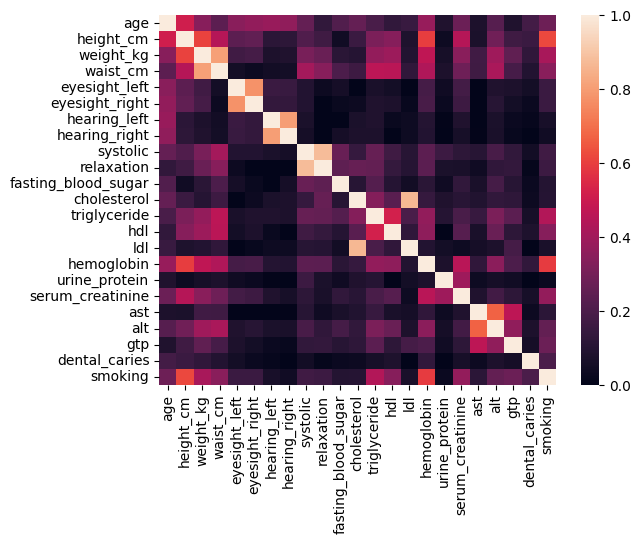

In [6]:
# Для хорошей работы phik, ему лучше указать все интервальные переменные
data_types = {'age': 'interval', #5-years gap
             'height_cm':'interval',
             'weight_kg':'ordinal',
             'waist_cm':'interval', #Длина окружности талии
             'eyesight_left':'ordinal',
             'eyesight_right':'ordinal',
             'hearing_left' :'categorical',
             'hearing_right' : 'categorical',
             'systolic' : 'interval',#Кровяное давление
             'relaxation' : 'interval',#Кровяное давление
             'fasting_blood_sugar' : 'interval',
             'cholesterol' : 'interval',
             'triglyceride' : 'interval', 
             'hdl': 'interval', #тип холестерина
             'ldl' : 'interval', #тип холестерина
             'hemoglobin': 'interval',
             'urine_protein': 'categorical',
             'serum_creatinine':'ordinal',
             'ast': 'interval',#тип глутаминоксалоуксусной трансаминазы
             'alt':'interval', #тип глутаминоксалоуксусной трансаминазы
             'gtp':'interval',
             'dental_caries': 'categorical',
             'smoking': 'categorical',
             }
interval_cols = [col for col, v in data_types.items() if v=='interval' and col in train.columns]

phik_matrix = phik.phik_matrix(train, interval_cols=interval_cols)
heatmap(phik_matrix)

Как и было сказано, у нас хорошо выделяются признаки, которые были сказаны выше и несколько других. Давайте выведем их топ

In [7]:
phik_matrix['smoking'].sort_values(ascending=False).to_frame().head(10)

,smoking
smoking,1.000000
height_cm,0.620378
hemoglobin,0.593640
triglyceride,0.437533
weight_kg,0.417608
serum_creatinine,0.369918
waist_cm,0.347437
hdl,0.337730
age,0.277979
gtp,0.275340


Теперь имея на руках корреляции и распределения, мы можем попробовать выделить признаки, которые могут нам понадобиться. Так же попробуем преобразовать некоторые признаки, чтобы лучше разделять курильщиков и некурильщиков. 

# Предобработка 1

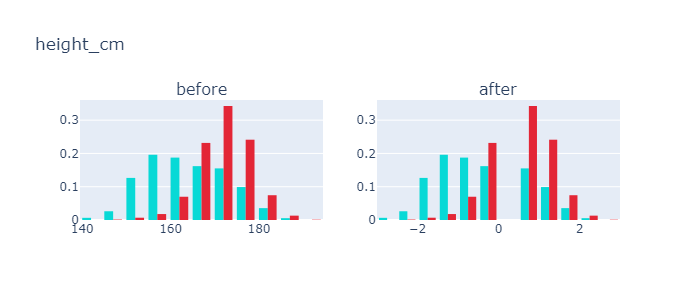

In [8]:
# Выделим признаки, с которыми будем работать 
favorite = [
            'height_cm',
            'hemoglobin',
            'triglyceride',
            'weight_kg',
            'serum_creatinine',
            'waist_cm',
            'hdl',
            'age',
            'gtp'
           ]

# будем хранить в одельной таблице наши преобразования
train_proc = train[[*favorite, 'smoking']].copy()
test_proc = test[[*favorite, 'smoking']].copy()

def proc(data_orig, inplace=False, scale_before=False, scale_after=True):
    '''
    Обработка признаков, для лучшего разделения данных. Принимает DataFrame с данными курильщиков и возвращает обработанную таблицу
    
    inplace - bool, изменяем ли мы изначальную таблицу или же её копию
    scale_before - bool, отвечает за то, будем ли мы стандартизировать данные до их обработки
    scale_after - bool, отвечает за то, будем ли мы стандартизировать данные до их обработки
    
    После того как что-то добавить или исправить,
    желательно предварительно посмотреть на график до и после, воспользовшись compose_feature
    тем самым мы лучше будем понимать как у нас получилось преобразовать фитчу
    '''
    if inplace == False:
        data = data_orig.copy()
    else:
        data = data_orig
    
    if scale_before==True:
        scaler = preprocessing.StandardScaler().fit(data.drop('smoking', axis=1))
        data[favorite] = scaler.transform(data.drop('smoking', axis=1))
    
    data['height_cm'] = np.power(data.height_cm, 1)
    data['waist_cm'] = (data['waist_cm'] / 10).round() * 10 # округляем значения признака, чтобы лучше билось на бины
    data['hemoglobin'] = np.clip(data.hemoglobin, 9, 25)
    data['serum_creatinine'] = np.clip(data['serum_creatinine'], 0, 2) # у этого признака есть небольшое количество выбросов, поэтому давайте их "обрежем"
    data['serum_creatinine'] = np.log1p(data.serum_creatinine)
    data['gtp'] = np.log1p(data.gtp)
    data['weight_kg'] = np.power(data.weight_kg, 2)
    data['triglyceride'] = np.log1p(data.triglyceride)
    data['age'] = np.power(data.age, 0.5)
    
    if scale_after==True:
        scaler = preprocessing.StandardScaler().fit(data.drop('smoking', axis=1))
        data[favorite] = scaler.transform(data.drop('smoking', axis=1))

    return data


fig = compose_feature(train_proc, proc(train_proc, scale_before=False, scale_after=True), 'height_cm')
fig.show(renderer='png')

Пока не ясно но почему-то тут появился провал около нуля.

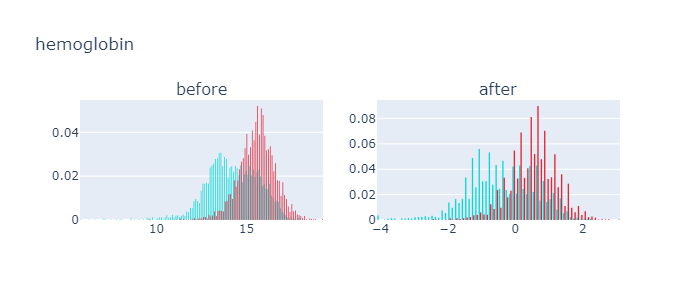

In [31]:
# Тут на самом деле я бы убрал такое распределение, т.к. оно стало менее плавным
fig = compose_feature(train_proc, proc(train_proc, scale_before=False, scale_after=True), 'hemoglobin')
fig.show(renderer='png')

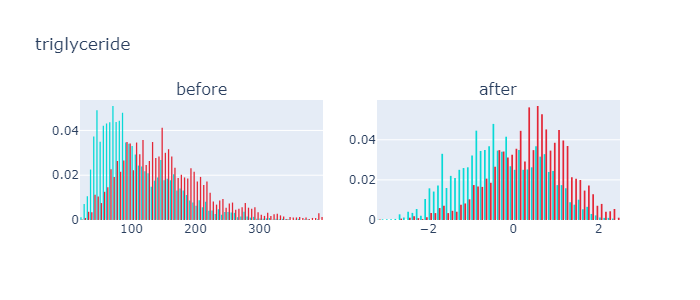

In [32]:
# Это преобразование выглядит не очень, т.к если сложить эти колонки, то может получитсять не очень хорошее распределение. 
# Вообще сам по себе признак по взгляду будет только мешать для выявления кластеров, но мы это проверим
fig = compose_feature(train_proc, proc(train_proc, scale_before=False, scale_after=True), 'triglyceride')
fig.show(renderer='png')

<Axes: >

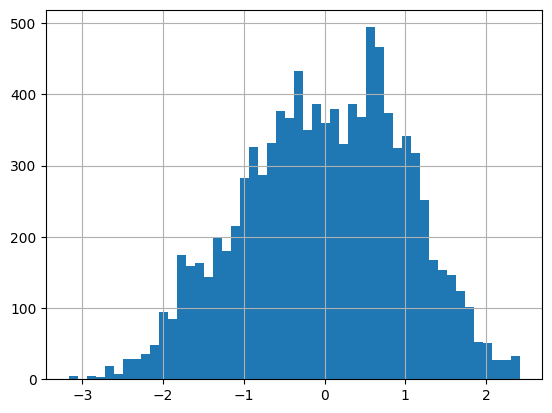

In [ ]:
#распределение признака после преобразования
proc(train_proc)['triglyceride'].hist(bins=50)

<Axes: >

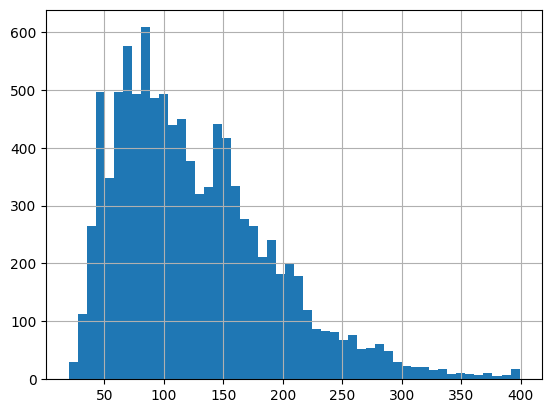

In [44]:
# распределение признака истинное. Как мне кажется, что тут более выражены отдельные моды, что кажется лучше будет для отделения
train['triglyceride'].hist(bins=50)

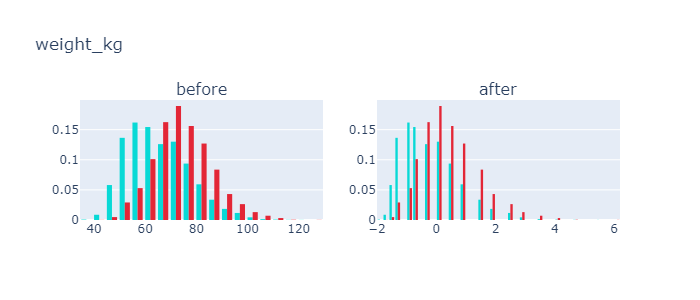

In [45]:
# особо сильно возведение в степерь возраста не даёт преимуществ.
# И как я наблюдал дальше, возведение только возведение в степень не даёт сильного отличия 
# (важное наблюдение, дальше я попробую как-то модифицировать эту идею)
fig = compose_feature(train_proc, proc(train_proc, scale_before=False, scale_after=True), 'weight_kg')
fig.show(renderer='png')

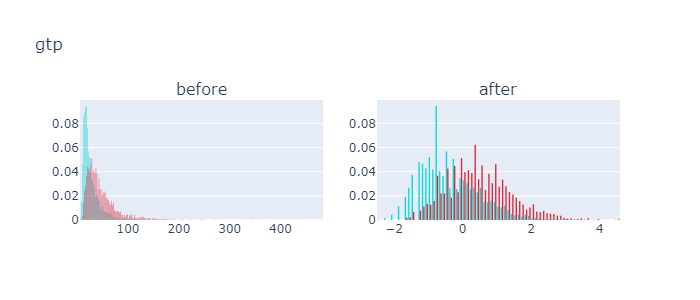

In [47]:
# а вот для этого признака распределение стало более симпотичным
fig = compose_feature(train_proc, proc(train_proc, scale_before=False, scale_after=True), 'gtp')
fig.show(renderer='png')

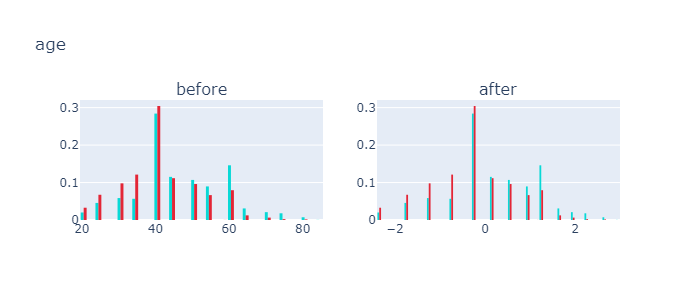

In [48]:
# Взятие корня тоже не сильно даёт результата
fig = compose_feature(train_proc, proc(train_proc, scale_before=False, scale_after=True), 'age')
fig.show(renderer='png')

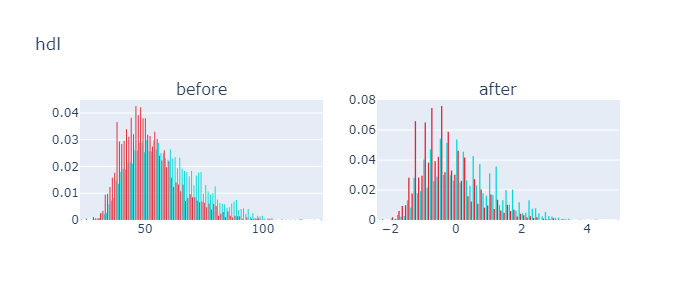

In [49]:
# Это изменение отменить
fig = compose_feature(train_proc, proc(train_proc, scale_before=False, scale_after=True), 'hdl')
fig.show(renderer='png')

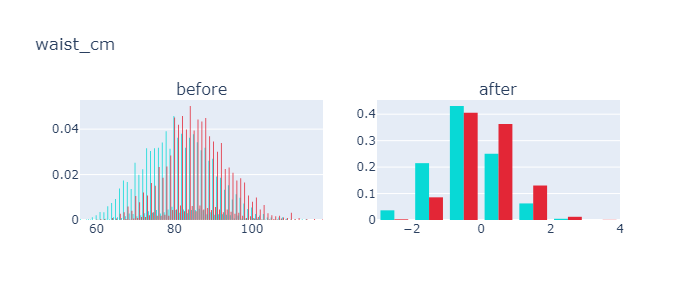

In [51]:
# Произошло округление и распределение стало более симпотичным. Как мне кажется, что так можно попробовать оставить
fig = compose_feature(train_proc, proc(train_proc, scale_before=False, scale_after=True), 'waist_cm')
fig.show(renderer='png')

Итак, перед тем как, попробуем построить кластеры, с которыми будем рассматривать различимость данных, мы посмотрим как будут строиться кластеры на сырых данных:

In [18]:
plot_data_train = train.copy()
plot_data_test = test.sample(1_000, random_state=911)

plot_data = pd.concat([plot_data_train, plot_data_test], axis=0, sort=False, ignore_index=True)

In [19]:
sample = plot_data

# Делаем заранее расчёты, которые нужны будут для tsne
preset_init = openTSNE.initialization.pca(sample, random_state=911)
preset_affinities_cos = openTSNE.affinity.PerplexityBasedNN(sample.drop('smoking', axis=1),
                                                        perplexity=30,
                                                        metric='cosine',
                                                        method='hnsw',
                                                        n_jobs=1,
                                                        random_state=911)

preset_affinities_l2 = openTSNE.affinity.PerplexityBasedNN(sample.drop('smoking', axis=1),
                                                        perplexity=30,
                                                        metric='l2',
                                                        method='hnsw',
                                                        n_jobs=1,
                                                        random_state=911)

make_tsne_preset_cos = partial(make_tsne, init=preset_init, affinities=preset_affinities_cos)
make_tsne_preset_l2 = partial(make_tsne, init=preset_init, affinities=preset_affinities_l2)

## Кластеры на сырых данных

In [20]:
hue_info = namedtuple('hue_info', ['field_name', 'is_categorical'])
def plot_standard_embeddings(plot_data, features, return_results=False):
    '''
    рисует "какие-то" эмбеддинги с hue='smoking' на одних и тех же фичах features
    '''
    mapper_dict = {
    'tsne perplex=30 exagger=4 dof=0.5 metric=l2': {
            'params': {
                'n_jobs': 1,
                'perplexity': 30,
                'verbose': False,
                'n_components': 2,
                'early_exaggeration_iter': 300,
                'early_exaggeration': 24,
                'n_iter': 1000,
                'exaggeration': 4,
                'metric': 'l2',
                'dof': 0.5,
                'neighbors': 'pynndescent'
            },
            'func': make_tsne_preset_l2,
        },
        'tsne perplex=30 exagger=4 dof=0.5 metric=cosine': {
            'params': {
                'n_jobs': 1,
                'perplexity': 30,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 4,
                'metric': 'cosine',
                'early_exaggeration_iter': 300,
                'early_exaggeration': 24,
                'n_iter': 1000,
                'dof': 0.5,
                'neighbors': 'pynndescent'
            },
            'func': make_tsne_preset_cos,
        },
        'UMAP 2D n_neighbors=100 metric=l2': {
            'params': {
               'n_neighbors': 100,
               'min_dist': 0.1,
               'metric': 'l2',
               'n_jobs': 1,
               'verbose': False,
               'n_components': 2
            },
            'func': make_umap,
        },
        'UMAP 2D n_neighbors=100 metric=cosine': {
            'params': {
               'n_neighbors': 100,
               'min_dist': 0.1,
               'metric': 'cosine',
               'n_jobs': 1,
               'verbose': False,
               'n_components': 2
            },
            'func': make_umap,
        }
    }

    res = plot_dim_reduction(
        data=plot_data,
        mapper_dict=mapper_dict,
        default_features=features,
        default_hue_info=hue_info(field_name='smoking', is_categorical=True),
        row_height=550,
        return_results=return_results
    )
    return res


res_base = plot_standard_embeddings(sample, favorite, return_results=True)

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [02:25<00:00, 36.41s/it]


Loading BokehJS ...

<img src='https://sun9-63.userapi.com/impg/RoE_tV832X5D8kIpAsJcpjlXoKv5RkJOWZ7ZwA/BRhHNZ5lLZc.jpg?size=1234x714&quality=96&sign=360daebbfa971af483772c3e751b353b&type=album'>

Вот такая каша получается, если мы возьмём за основу сырые признаки без обработки (правый нижний кластер похож на кита, наверное это какая-то хитрая закономерность). Давайте посмотрим как будет вести себя наша первая обработка.

In [21]:
# Cохраним изменения обработки
train_proc = train[[*favorite, 'smoking']].copy()
test_proc = test[[*favorite, 'smoking']].copy()

proc(train_proc, scale_before=False, scale_after=True, inplace=True)
proc(test_proc, scale_before=False, scale_after=True, inplace=True)

plot_data_train = train_proc.copy()
plot_data_test = test_proc.sample(1_000, random_state=911)

plot_data = pd.concat([plot_data_train, plot_data_test], axis=0, sort=False, ignore_index=True)

In [22]:
sample = plot_data

# Делаем заранее расчёты, которые нужны будут для tsne
preset_init = openTSNE.initialization.pca(sample, random_state=911)
preset_affinities_cos = openTSNE.affinity.PerplexityBasedNN(sample.drop('smoking', axis=1),
                                                        perplexity=30,
                                                        metric='cosine',
                                                        method='hnsw',
                                                        n_jobs=1,
                                                        random_state=911)

preset_affinities_l2 = openTSNE.affinity.PerplexityBasedNN(sample.drop('smoking', axis=1),
                                                        perplexity=30,
                                                        metric='l2',
                                                        method='hnsw',
                                                        n_jobs=1,
                                                        random_state=911)

make_tsne_preset_cos = partial(make_tsne, init=preset_init, affinities=preset_affinities_cos)
make_tsne_preset_l2 = partial(make_tsne, init=preset_init, affinities=preset_affinities_l2)

## Кластеры на обработке 1

In [23]:
res_1 = plot_standard_embeddings(sample, favorite, return_results=True)

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [02:38<00:00, 39.51s/it]


Loading BokehJS ...

<img src='https://sun9-31.userapi.com/impg/tloO1t4gOOTSAHtt_ZWvy_5Lzty_7sGHPVHiFQ/fYMU8ZOZBjA.jpg?size=1231x715&quality=96&sign=6d5f77be9c2cbfce4597e6344bb92c76&type=album'>

Как видим tsne не смог переварить эту обработку, но можно заметить, что UMAP смог отделить кластер с некурящими людьми (с ошибками, но всё же), но ему не удалось отделить курящих от некурящих (а это непростая задача)

# Предобработка 2

В этой предобработке я уберу лишние, на мой взгляд на гистрограммы, какие-то обработки данных и посмотрим, что получится

In [26]:
favorite = [
            'height_cm',
            'hemoglobin',
            'triglyceride',
            'weight_kg',
            'serum_creatinine',
            'waist_cm',
            'hdl',
            'age',
            'gtp'
           ]

train_proc = train[[*favorite, 'smoking']].copy()
test_proc = test[[*favorite, 'smoking']].copy()

# отличается от первой версии тем, что мы меняем только 
def proc_v2(data_orig, inplace=False, scale_before=False, scale_after=True):
    if inplace == False:
        data = data_orig.copy()
    else:
        data = data_orig
    
    if scale_before==True:
        scaler = preprocessing.StandardScaler().fit(data.drop('smoking', axis=1))
        data[favorite] = scaler.transform(data.drop('smoking', axis=1))
    
    data['waist_cm'] = (data['waist_cm'] / 10).round() * 10 # округляем значения признака, чтобы лучше билось на бины
    data['serum_creatinine'] = np.clip(data['serum_creatinine'], 0, 2) # у этого признака есть небольшое количество выбросов, поэтому давайте их "обрежем"
    data['serum_creatinine'] = np.log1p(data.serum_creatinine)
    data['gtp'] = np.log1p(data.gtp)

    
    if scale_after==True:
        scaler = preprocessing.StandardScaler().fit(data.drop('smoking', axis=1))
        data[favorite] = scaler.transform(data.drop('smoking', axis=1))

    return data

proc_v2(train_proc, scale_before=False, scale_after=True, inplace=True)
proc_v2(test_proc, scale_before=False, scale_after=True, inplace=True)
print()

Теперь давайте попробуем кластеризовать наши данные и посмотрим, что из этого может выйти

In [27]:
plot_data_train = train_proc.copy()
plot_data_test = test_proc.sample(1_000, random_state=911)

plot_data = pd.concat([plot_data_train, plot_data_test], axis=0, sort=False, ignore_index=True)

In [28]:
sample = plot_data
preset_init = openTSNE.initialization.pca(sample, random_state=911)
preset_affinities_cos = openTSNE.affinity.PerplexityBasedNN(sample.drop('smoking', axis=1),
                                                        perplexity=30,
                                                        metric='cosine',
                                                        method='hnsw',
                                                        n_jobs=1,
                                                        random_state=911)

preset_affinities_l2 = openTSNE.affinity.PerplexityBasedNN(sample.drop('smoking', axis=1),
                                                        perplexity=30,
                                                        metric='l2',
                                                        method='hnsw',
                                                        n_jobs=1,
                                                        random_state=911)

make_tsne_preset_cos = partial(make_tsne, init=preset_init, affinities=preset_affinities_cos)
make_tsne_preset_l2 = partial(make_tsne, init=preset_init, affinities=preset_affinities_l2)

## Кластеры на обработке 2

In [29]:
res_2 = plot_standard_embeddings(sample, favorite, return_results=True)

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [02:23<00:00, 35.85s/it]


Loading BokehJS ...

<img src='https://sun9-49.userapi.com/impg/yP_-7wwtgQyEVb6GWB1mD1qcPXCp6JBxd4LhlA/VB4d8HOoi54.jpg?size=1233x719&quality=96&sign=2ddee97b2466b443e9f9e89c93be9d5e&type=album'>

На самом деле что на обработке 1 и обработке 2 очень похожая картина, видимо нам нужен какой-то инструмент, который будет помогать выбирать преобразования признаков, чтобы выходило лучше

# Сравнение предобработок

In [38]:
# Давайте посмотрим как у нас изменилось зависимость признаков от smoking до и после предобработки
def phik_corr_comp(before, after):
    phik_mat_before = phik.phik_matrix(before, interval_cols=interval_cols)['smoking'].to_frame()
    phik_mat_after = phik.phik_matrix(after, interval_cols=interval_cols)['smoking'].to_frame()
    phik_mat_before = phik_mat_before.round(decimals=2)
    phik_mat_after = phik_mat_after.round(decimals=2)
    phik_comp = pd.concat([phik_mat_before, phik_mat_after], axis=1, keys=['phik_corr_before', 'phik_corr_after'])
    phik_comp = phik_comp.droplevel(level=1, axis=1)
    phik_comp = phik_comp.sort_values('phik_corr_after', ascending=False)
    phik_comp['result'] = phik_comp.apply(lambda row: 'Good' if row['phik_corr_after'] > row['phik_corr_before'] else (
                                                                        '=' if row['phik_corr_after'] == row['phik_corr_before'] else 'Bad'), axis=1)
    return phik_comp.head(len(favorite)+1)
    
phik_corr_comp(train, train_proc)

,phik_corr_before,phik_corr_after,result
smoking,1.00,1.00,=
height_cm,0.62,0.62,=
hemoglobin,0.59,0.59,=
gtp,0.28,0.54,Good
triglyceride,0.44,0.44,=
weight_kg,0.42,0.42,=
serum_creatinine,0.37,0.41,Good
hdl,0.34,0.34,=
age,0.28,0.28,=
waist_cm,0.35,0.24,Bad


Отлично! Теперь у нас появился новый инструмент для анализа того, как какое изменение признака лучше сказывается на корреляции того, является ли признак важен для определения курильщиков и не курильщиков. Как видно, логарифмирование `gtp` даёт хороший прирост, а округление `waist_cm` хуже сказывается для определения зависимости. Помимо этого давайте ещё уберём изменения, которые практически не изменили корреляцию.

In [39]:
# Сравним proc() и proc_v2()
train_proc1 = train[[*favorite, 'smoking']].copy()
train_proc2 = train[[*favorite, 'smoking']].copy()
proc(train_proc1, inplace=True)
proc_v2(train_proc2, inplace=True)

phik_corr_comp(train_proc1, train_proc2)

,phik_corr_before,phik_corr_after,result
smoking,1.00,1.00,=
height_cm,0.62,0.62,=
hemoglobin,0.60,0.59,Bad
gtp,0.54,0.54,=
triglyceride,0.44,0.44,=
weight_kg,0.42,0.42,=
serum_creatinine,0.41,0.41,=
hdl,0.34,0.34,=
age,0.25,0.28,Good
waist_cm,0.24,0.24,=


Так, мы смогли сделать улучшения с точки зрения сырых данных, но между обработками у нас не так много изменений, что не есть хорошо! 

После изменения признаков, давайте попробуем добавить новый признак. Для этого можно попробовать их складывать, умножать, делить между собой и посмотреть, что по итогу получится

# Предобработка 3

In [51]:
favorite = [
            'height_cm',
            'hemoglobin',
            'triglyceride',
            'weight_kg',
            'serum_creatinine',
            'waist_cm',
            'hdl',
            'age',
            'gtp'
           ]

train_proc = train[[*favorite, 'smoking']].copy()
test_proc = test[[*favorite, 'smoking']].copy()

def proc_v3_1(data_orig, inplace=False, scale_before=False, scale_after=True):
    if inplace == False:
        data = data_orig.copy()
    else:
        data = data_orig
    
    if scale_before==True:
        scaler = preprocessing.StandardScaler().fit(data.drop('smoking', axis=1))
        data[favorite] = scaler.transform(data.drop('smoking', axis=1))
    
    data['serum_creatinine'] = np.clip(data['serum_creatinine'], 0, 2) # у этого признака есть небольшое количество выбросов,
                                                                       # поэтому давайте их "обрежем"
    data['serum_creatinine'] = np.log1p(data.serum_creatinine)
    data['gtp'] = np.log1p(data.gtp)
    
    # Добавляю новый признак. 
    # Я руководстуюсь такой логикой: давайте возьмём самые влиятельные признаки и попробуем сделать их композицию
    data['hhg'] = (
        np.power(data['height_cm'], 1) * np.power(data['hemoglobin'], 1)  * np.power(data['gtp'], 1)
    )
    
    if 'hhg' not in favorite:
        favorite.append('hhg')

    if scale_after==True:
        scaler = preprocessing.StandardScaler().fit(data.drop('smoking', axis=1))
        data[favorite] = scaler.transform(data.drop('smoking', axis=1))

    return data

proc_v3_1(train_proc, inplace=True)
proc_v3_1(test_proc, inplace=True)
print()

Теперь давайте посмотрим хорошее ли получилось распределение у признака с `height_cm` (лучший разделитель):

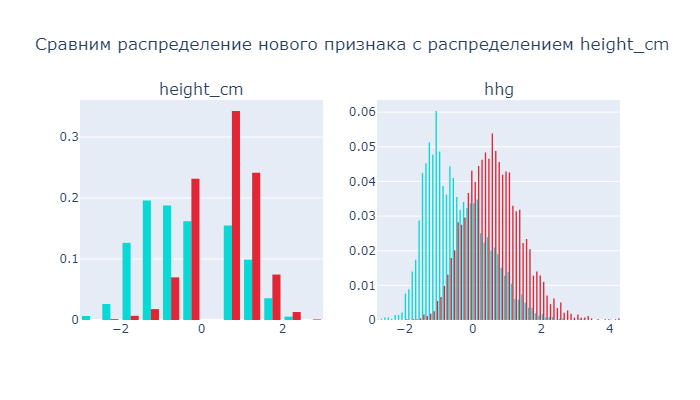

In [52]:
# Отрисует как распределён новый признак
fig = make_subplots(rows=1, cols=2, subplot_titles=['height_cm', 'hhg'])
fig.add_trace(go.Histogram(x=train_proc[train_proc['smoking']==0]['height_cm'],
                           name='no_smoke',
                           marker_color='#08D9D6',
                           histnorm='probability'),
                           row=1, col=1)
fig.add_trace(go.Histogram(x=train_proc[train_proc['smoking']==1]['height_cm'],
                           name='smoke',
                           marker_color='#E32636',
                           histnorm='probability'),
                           row=1, col=1)

fig.add_trace(go.Histogram(x=train_proc[train_proc['smoking']==0]['hhg'],
                           name='no_smoke',
                           marker_color='#08D9D6',
                           histnorm='probability'),
                           row=1, col=2)
fig.add_trace(go.Histogram(x=train_proc[train_proc['smoking']==1]['hhg'],
                           name='smoke',
                           marker_color='#E32636',
                           histnorm='probability'),
                           row=1, col=2)

fig.update_layout(height=400, title_text='Сравним распределение нового признака с распределением height_cm', showlegend=False)
fig.show(renderer='png')

Я очень доволен получившимся распределением. По нему видно, что у нас явно стало меньше пересечений. Давайте посмотрим, что скажет нам коэффициент корреляции

In [60]:
# т.к мы начали добавлять в favorite признаки, которых нет в trian, давайте напишем мини функцию, которая делает favorite стандартным
def set_fav():
    favorite = [
            'height_cm', 'hemoglobin', 'triglyceride', 'weight_kg', 'serum_creatinine', 'waist_cm', 'hdl', 'age', 'gtp'
           ]
    return favorite

favorite = set_fav()
interval_cols.append('hhg')

train_proc1 = train[[*favorite, 'smoking']].copy()
train_proc2 = train[[*favorite, 'smoking']].copy()
proc_v2(train_proc1, inplace=True)
proc_v3_1(train_proc2, inplace=True)

phik_corr_comp(train_proc1, train_proc2)

,phik_corr_before,phik_corr_after,result
smoking,1.00,1.00,=
hhg,NaN,0.68,Bad
height_cm,0.62,0.62,=
hemoglobin,0.59,0.59,=
gtp,0.54,0.54,=
triglyceride,0.44,0.44,=
weight_kg,0.42,0.42,=
serum_creatinine,0.41,0.41,=
waist_cm,0.24,0.35,Good
hdl,0.34,0.34,=


Отлично! Мы смогли создать признак, который даёт хорошую корреляцию с курильщиками (не обращайте внимание на result Bad, он не может обработать сравнение с NaN). И помимо этого ещё улучшили другой проказатель.

Но давайте ещё попробуем поиграться с этим признаком. Что будет, если мы попробуем возводить некоторые множители в степень?

In [57]:
favorite = set_fav()

train_proc = train[[*favorite, 'smoking']].copy()
test_proc = test[[*favorite, 'smoking']].copy()

def proc_v3_2(data_orig, inplace=False, scale_before=False, scale_after=True):
    if inplace == False:
        data = data_orig.copy()
    else:
        data = data_orig
    
    if scale_before==True:
        scaler = preprocessing.StandardScaler().fit(data.drop('smoking', axis=1))
        data[favorite] = scaler.transform(data.drop('smoking', axis=1))
    
    data['serum_creatinine'] = np.clip(data['serum_creatinine'], 0, 2) # у этого признака есть небольшое количество выбросов,
                                                                       # поэтому давайте их "обрежем"
    data['serum_creatinine'] = np.log1p(data.serum_creatinine)
    data['gtp'] = np.log1p(data.gtp)
    
    # Добавляю новый признак. 
    # Я руководстуюсь такой логикой: давайте возьмём самые влиятельные признаки и попробуем сделать их композицию
    # Добавляю в этой версии степени
    data['hhg'] = (
        np.power(data['height_cm'], 3) * np.power(data['hemoglobin'], 2)  * np.power(data['gtp'], 1)
    )
    
    if 'hhg' not in favorite:
        favorite.append('hhg')

    if scale_after==True:
        scaler = preprocessing.StandardScaler().fit(data.drop('smoking', axis=1))
        data[favorite] = scaler.transform(data.drop('smoking', axis=1))

    return data

proc_v3_2(train_proc, inplace=True)
proc_v3_2(test_proc, inplace=True)
print()

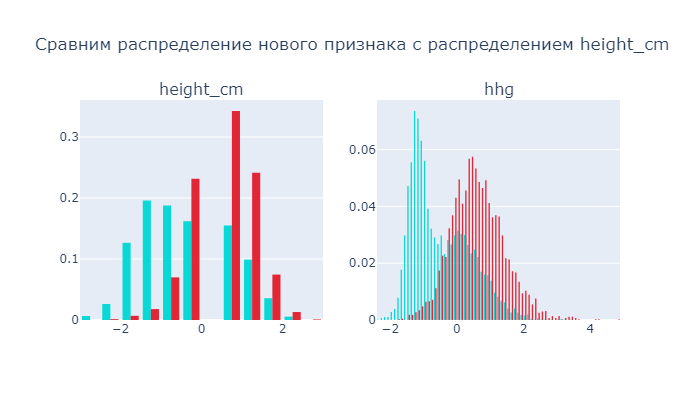

In [58]:
# Отрисует как распределён новый признак
fig = make_subplots(rows=1, cols=2, subplot_titles=['height_cm', 'hhg'])
fig.add_trace(go.Histogram(x=train_proc[train_proc['smoking']==0]['height_cm'],
                           name='no_smoke',
                           marker_color='#08D9D6',
                           histnorm='probability'),
                           row=1, col=1)
fig.add_trace(go.Histogram(x=train_proc[train_proc['smoking']==1]['height_cm'],
                           name='smoke',
                           marker_color='#E32636',
                           histnorm='probability'),
                           row=1, col=1)

fig.add_trace(go.Histogram(x=train_proc[train_proc['smoking']==0]['hhg'],
                           name='no_smoke',
                           marker_color='#08D9D6',
                           histnorm='probability'),
                           row=1, col=2)
fig.add_trace(go.Histogram(x=train_proc[train_proc['smoking']==1]['hhg'],
                           name='smoke',
                           marker_color='#E32636',
                           histnorm='probability'),
                           row=1, col=2)

fig.update_layout(height=400, title_text='Сравним распределение нового признака с распределением height_cm', showlegend=False)
fig.show(renderer='png')

Так, картинка изменилась (в отличии от случаев, когда мы возводили в степень один признак -- инсайт!). Давайте посмотрим, как это скажется на картине корреляции

In [69]:
favorite = set_fav()

train_proc1 = train[[*favorite, 'smoking']].copy()
train_proc2 = train[[*favorite, 'smoking']].copy()
proc_v3_1(train_proc1, inplace=True)
proc_v3_2(train_proc2, inplace=True)

phik_corr_comp(train_proc1, train_proc2)

,phik_corr_before,phik_corr_after,result
smoking,1.00,1.00,=
hhg,0.68,0.70,Good
height_cm,0.62,0.62,=
hemoglobin,0.59,0.59,=
gtp,0.54,0.54,=
triglyceride,0.44,0.44,=
weight_kg,0.42,0.42,=
serum_creatinine,0.41,0.41,=
waist_cm,0.35,0.35,=
hdl,0.34,0.34,=


Немного, но мы смогли улучшить этот признак! Давайте теперь попробуем посмотреть какие класстеры у нас получаются.

In [62]:
plot_data_train = train_proc.copy()
plot_data_test = test_proc.sample(1_000, random_state=911)

plot_data = pd.concat([plot_data_train, plot_data_test], axis=0, sort=False, ignore_index=True)

sample = plot_data
preset_init = openTSNE.initialization.pca(sample, random_state=911)
preset_affinities_cos = openTSNE.affinity.PerplexityBasedNN(sample.drop('smoking', axis=1),
                                                        perplexity=30,
                                                        metric='cosine',
                                                        method='hnsw',
                                                        n_jobs=1,
                                                        random_state=911)

preset_affinities_l2 = openTSNE.affinity.PerplexityBasedNN(sample.drop('smoking', axis=1),
                                                        perplexity=30,
                                                        metric='l2',
                                                        method='hnsw',
                                                        n_jobs=1,
                                                        random_state=911)

make_tsne_preset_cos = partial(make_tsne, init=preset_init, affinities=preset_affinities_cos)
make_tsne_preset_l2 = partial(make_tsne, init=preset_init, affinities=preset_affinities_l2)

## Кластеры на обработке 3

In [63]:
res_3 = plot_standard_embeddings(sample, favorite, return_results=True)

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [02:19<00:00, 34.80s/it]


Loading BokehJS ...

<img src='https://sun9-9.userapi.com/impg/BhPeNVXD_m_CbZI-te-PX_VHXbMpKP6m3AsAXQ/4KqbnckmstY.jpg?size=1233x717&quality=96&sign=eba57e2974b24cfdb33aed0fc29422eb&type=album'>

Вот это уже будет лучше, чем на прошлых обработках. Но видно, что ещё есть куда расти. Под розовыми точками находятся жёлтые и кластер  некурящих имеет какое-то количество ошибок.

# Предобработка 4

На этом этапе я попробую посмотреть, что будет, если мы уберём слабые признаки. Может ли это в нашем случае улучшить ситуацию?

In [74]:
# Легко увидеть, какие именно пункты я решил убрать.
# Если это не поможет, я верну их обратно и буду пробовать создавать новые признаки
favorite = [
            'height_cm',
            'hemoglobin',
            'triglyceride',
            'weight_kg',
            'serum_creatinine',
            #'waist_cm',
            #'hdl',
            #'age',
            'gtp'
           ]

train_proc = train[[*favorite, 'smoking']].copy()
test_proc = test[[*favorite, 'smoking']].copy()

def proc_v4(data_orig, inplace=False, scale_before=False, scale_after=True):
    if inplace == False:
        data = data_orig.copy()
    else:
        data = data_orig
    
    if scale_before==True:
        scaler = preprocessing.StandardScaler().fit(data.drop('smoking', axis=1))
        data[favorite] = scaler.transform(data.drop('smoking', axis=1))
    
    data['serum_creatinine'] = np.clip(data['serum_creatinine'], 0, 2) # у этого признака есть небольшое количество выбросов,
                                                                       # поэтому давайте их "обрежем"
    data['serum_creatinine'] = np.log1p(data.serum_creatinine)
    data['gtp'] = np.log1p(data.gtp)
    
    # Добавляю новый признак. 
    # Я руководстуюсь такой логикой: давайте возьмём самые влиятельные признаки и попробуем сделать их композицию
    # Добавляю в этой версии степени
    data['hhg'] = (
        np.power(data['height_cm'], 3) * np.power(data['hemoglobin'], 2)  * np.power(data['gtp'], 1)
    )
    
    if 'hhg' not in favorite:
        favorite.append('hhg')

    if scale_after==True:
        scaler = preprocessing.StandardScaler().fit(data.drop('smoking', axis=1))
        data[favorite] = scaler.transform(data.drop('smoking', axis=1))

    return data

proc_v4(train_proc, inplace=True)
proc_v4(test_proc, inplace=True)
print()

In [75]:
plot_data_train = train_proc.copy()
plot_data_test = test_proc.sample(1_000, random_state=911)

plot_data = pd.concat([plot_data_train, plot_data_test], axis=0, sort=False, ignore_index=True)

sample = plot_data
preset_init = openTSNE.initialization.pca(sample, random_state=911)
preset_affinities_cos = openTSNE.affinity.PerplexityBasedNN(sample.drop('smoking', axis=1),
                                                        perplexity=30,
                                                        metric='cosine',
                                                        method='hnsw',
                                                        n_jobs=1,
                                                        random_state=911)

preset_affinities_l2 = openTSNE.affinity.PerplexityBasedNN(sample.drop('smoking', axis=1),
                                                        perplexity=30,
                                                        metric='l2',
                                                        method='hnsw',
                                                        n_jobs=1,
                                                        random_state=911)

make_tsne_preset_cos = partial(make_tsne, init=preset_init, affinities=preset_affinities_cos)
make_tsne_preset_l2 = partial(make_tsne, init=preset_init, affinities=preset_affinities_l2)

## Кластеры на обработке 4

In [76]:
res_4 = plot_standard_embeddings(sample, favorite, return_results=True)

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [02:25<00:00, 36.45s/it]


Loading BokehJS ...

Хм, картинка не стала сильно лучше... Видимо нужно подобрать новый признак